# Filtering Bioacoustic Signals

Fauna and birds surveys based on bioacoustic signal processing provide useful information for biodiversity conservation decisions. In Colombia, the Insthumid foreituto
Alexander von Humboldt (IAvH) [1] carries out projects on bioacoustic monitoring that generate hundreds of recording time in the paramo and humid forests. Because of this large volume of information, the automatic analysis of these audio signals is necessary to recognize the species. A common procedure in the analysis of these  signals is insect noise filtering from bird calls in teh recordings. For instance, the spectrogram of the bird Tucan pechiblanco (Ramphastos tucanus)  [2] is displayed below. The objetive of this progamming exercise is to analyze this bioacoustic signal to remove the frequency component that  correspond to insect noise by using finite impulse response (FIR) and infinite impulse response (IIR) filters.

http://www.humboldt.org.co/es/

https://xeno-canto.org/442392



In [2]:
import pandas as pd
import numpy as np
import IPython.display as ipd
import librosa
import librosa.display
import warnings
warnings.filterwarnings('ignore')
from scipy import signal
import scipy.signal as sig
from scipy.fft import fftshift
import matplotlib.pyplot as plt
import soundfile as sf
y, sr = librosa.load('CantoTucan.mp3', sr=None)         # The original signal sampling frequency is used.
original_signal = y

## Plotting the signal in the time  and frequency domains

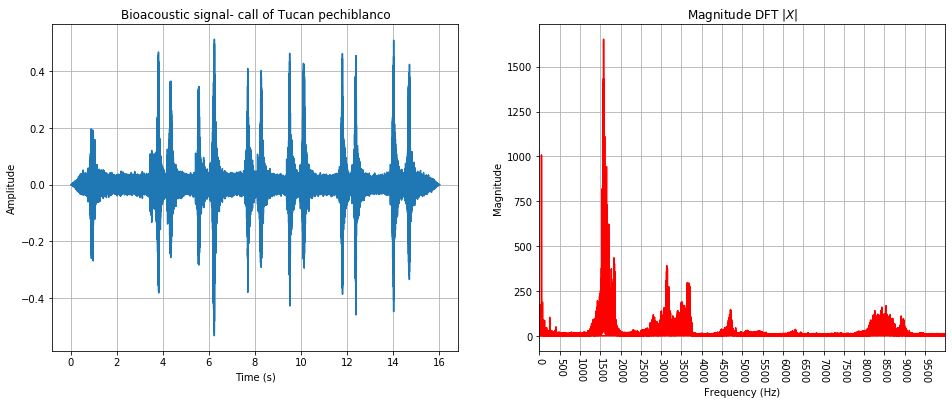

In [3]:
t = np.arange(y.shape[0]) / sr                          # Time axis
plt.figure(figsize=(16, 6))                           
plt.subplot(1, 2, 1)
plt.grid()
plt.plot(t, y)                                          # Gráfica del audio en el tiempo.
plt.title('Bioacoustic signal- call of Tucan pechiblanco')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')

X = np.fft.fft(y)                                       # FFT
freq = np.fft.fftfreq(y.size, d=1/sr)                   # Frequency axis
plt.subplot(1, 2, 2)
plt.grid()
plt.plot(freq, np.abs(X),'r')                           # Plot Magnitude.
plt.xlim([0, 10000])                                    # Positive frequencies
plt.title('Magnitude DFT $|X|$')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Magnitude') 
plt.xticks(np.arange(0, 10000, step=500))              
plt.xticks(rotation = -90)

plt.show()
ipd.Audio('CantoTucan.mp3')                             # Listen to the bioacoustic signal

## Bioacoustic signal spectrogram:

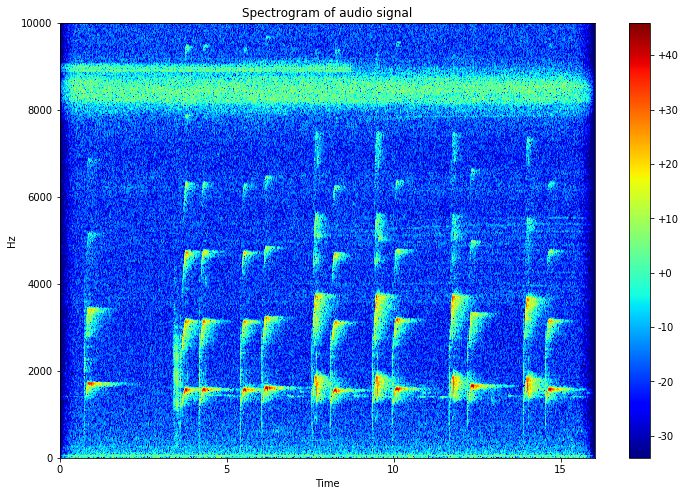

In [7]:
def espectrograma(audio, sr):
    longitud_marco = 2048
    longitud_salto = 256
    transformada_corta = librosa.stft(audio, longitud_marco, longitud_salto)  # Short Time Fourier Transform
    Magnitud_transformada_corta = np.abs(transformada_corta) ** 2             # Magnitud  de la transformada
    Y_log_audio = librosa.power_to_db(Magnitud_transformada_corta)
    Y_audio = Y_log_audio
    fig, ax = plt.subplots(figsize=(12, 8))
    librosa.display.specshow(Y_audio, sr=sr, hop_length=longitud_salto,x_axis="time", y_axis="linear", cmap = 'jet')
    plt.colorbar(format="%+2.f")
    ax.set(title='Spectrogram of audio signal', ylim=[0, 10000])   
    
    
espectrograma(y, sr)

## Parameters for filter design:

In [8]:
# Parámetros del filtro:
banda_transicion = 250                                  # Transicion band.
frec_paso2 = 1000
frec_paso1 = 7000

M = 3.1/(banda_transicion/sr)
M = int(np.around(M))                                   # Parameters for Finite Impulse Response  (FIR) filters.                                                            
N = M-1

fc1 = frec_paso1 + banda_transicion/2                     # High cut frequency 
fc2 = frec_paso2 - banda_transicion/2                     # Low cut frequency 
w_c1 = 2*np.pi*(fc1/sr)                                 # Normalized high cut frequency. 
w_c2 = 2*np.pi*(fc2/sr)                                 # Normalized low cut frequency. 
n = np.arange(0,N)

## FIR filter design with rectangular window

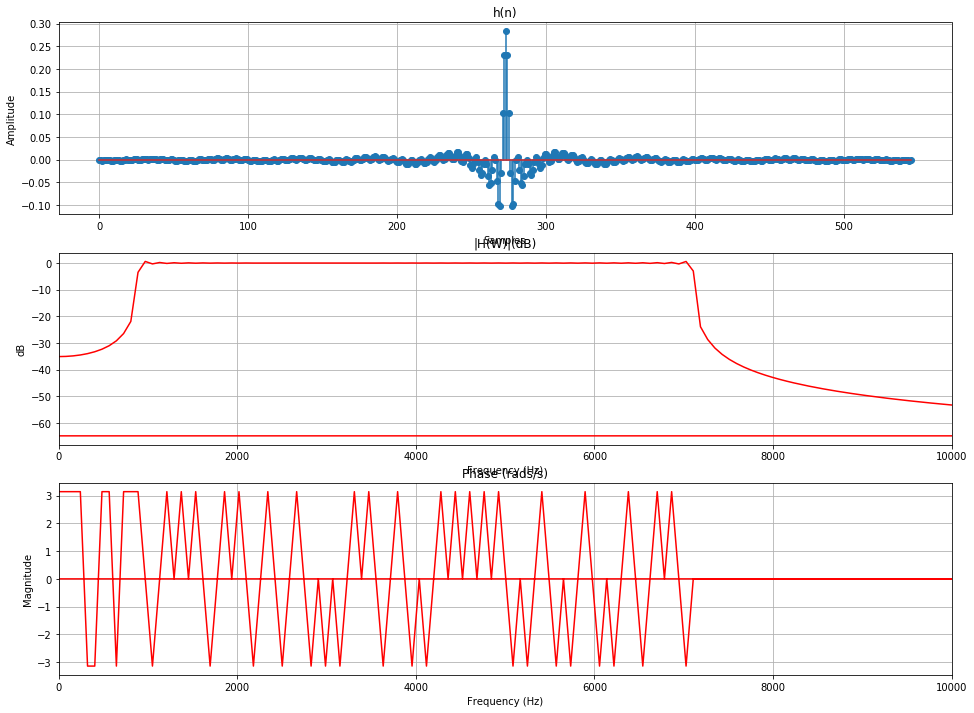

In [16]:
#Coeficientes de la ventana ideal:
#h_d = np.sin(w_c1*(n-(M-1)/2))/(np.pi*(n-(M-1)/2)) - np.sin(w_c2*(n-(M-1)/2))/(np.pi*(n-(M-1)/2)) # ventana pasabandas
#h_d[round((M-1)/2)] = w_c1/np.pi - w_c2/np.pi          # Se elimina la indeterminación 

h_d1 = np.sin(w_c1*(n-(M-1)/2))/(np.pi*(n-(M-1)/2))     # h(n) for low-pass filter with cut frequency fc1. 
h_d1[round((M-1)/2)] = w_c1/np.pi                       # h(n), n=(M-1)/2.

h_d2 = np.sin(w_c2*(n-(M-1)/2))/(np.pi*(n-(M-1)/2))     # h(n) for low-pass filter with cut frequency fc1.  
h_d2[round((M-1)/2)] = w_c2/np.pi                       # h(n), n=(M-1)/2.

h_d = h_d1 - h_d2                                       # h(n) for band pass filter.
   
plt.figure(figsize=(16, 12))
plt.subplot(3, 1, 1)
plt.grid()
plt.stem(h_d)                                           # Se grafica la ventana Ideal pasa bandas.
plt.title('h(n)')
plt.xlabel('Samples')
plt.ylabel('Amplitude')


""""H_d = np.fft.fft(h_d)                                      
freqH = np.fft.fftfreq(h_d.size, d=1/sr)   
plt.subplot(2, 2, 2)
plt.grid()
plt.plot(freqH, (np.abs(H_d)),'r')    
plt.xlim([-10000, 10000])                                    
plt.title('Magnitude in frequency domain - Rectangular window')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Magnitude')""" 

freqH = np.fft.fftfreq(h_d.size, d=1/sr)   
plt.subplot(3, 1, 2)
plt.grid()
plt.plot(freqH, 20*np.log10(np.abs(H_d)),'r')    
plt.xlim([0, 10000])                                    
plt.title('|H(W)|(dB)')
plt.xlabel('Frequency (Hz)')
plt.ylabel('dB') 

#Filter Phase
phase = np.angle(H_d)                                
plt.subplot(3, 1, 3)
plt.grid()
plt.plot(freqH, phase,'r')    
plt.xlim([0, 10000]) 
plt.title('Phase (rads/s)')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Magnitude') 



plt.show()


## Hanning window for FIR filter design


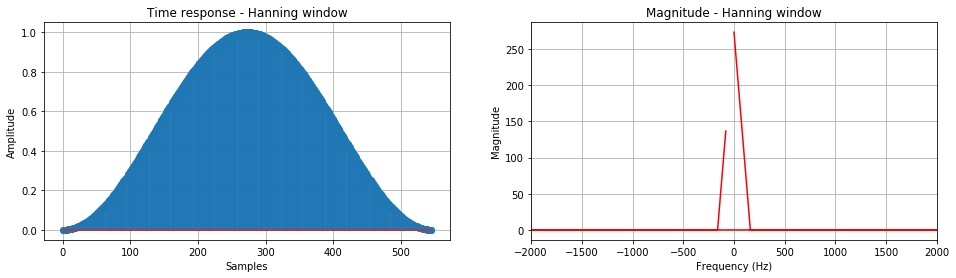

In [17]:
# Respuesta en frecuencia de las ventanas anteriores:

#Hanning window coefficients:
w_Hanning = 0.5 - 0.5*np.cos((2*np.pi*n)/(M-1))
plt.figure(figsize=(16, 4)) 
plt.subplot(1, 2, 1)
plt.grid()
plt.stem(w_Hanning)
plt.title('Time response - Hanning window')
plt.xlabel('Samples')
plt.ylabel('Amplitude')

#Frequency response of Hanning window:
W_H = np.fft.fft(w_Hanning)                                      
freqW = np.fft.fftfreq(w_Hanning.size, d=1/sr)  
plt.subplot(1, 2, 2)
plt.grid()
plt.plot(freqW, np.abs(W_H),'r')    
plt.xlim([-2000, 2000])                                    
plt.title('Magnitude - Hanning window')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Magnitude') 


plt.show()


## Se crea el filtro con el producto de las ventanas anteriores


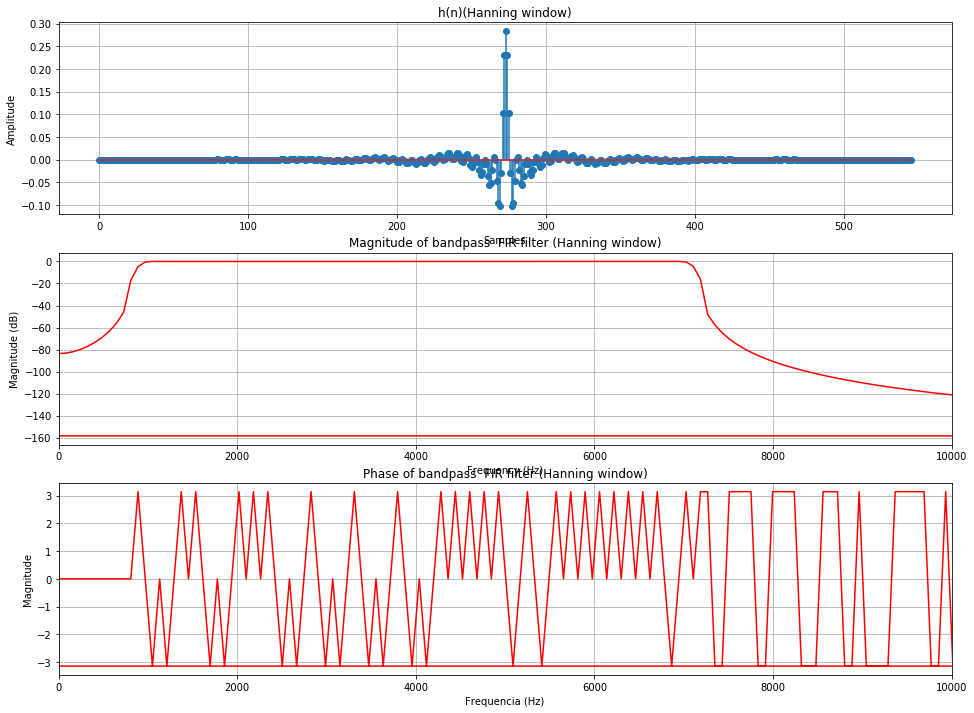

In [21]:
#Coeficientes del filtro h_d * W_hanning:

h_BP = h_d*w_Hanning                                    # Filtro pasa bandas implementado.
plt.figure(figsize=(16,12))   
plt.subplot(3, 1, 1)
plt.grid()
plt.stem(h_BP)
plt.title('h(n)(Hanning window)')
plt.xlabel('Samples')
plt.ylabel('Amplitude')

H_BP = np.fft.fft(h_BP)                                 # Respuesta en frecuencia del filtro implementado.                                   
freqH_BP = np.fft.fftfreq(h_BP.size, d=1/sr)  
plt.subplot(3, 1, 2)
plt.grid()
plt.plot(freqH_BP, 20*np.log10(np.abs(H_BP)),'r')    
plt.xlim([0, 10000])                                    
plt.title('Magnitude of bandpass  FIR filter (Hanning window)')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Magnitude (dB)') 


#fase del filtro (fase lineal)
phase = np.angle(H_BP)                                
plt.subplot(3, 1, 3)
plt.grid()
plt.plot(freqH_BP, phase,'r')    
plt.xlim([0, 10000]) 
plt.title('Phase of bandpass  FIR filter (Hanning window)')
plt.xlabel('Frequencia (Hz)')
plt.ylabel('Magnitude') 

plt.show()

#Filter order:
print('Filter order is: ',M)

## Signal filtering:

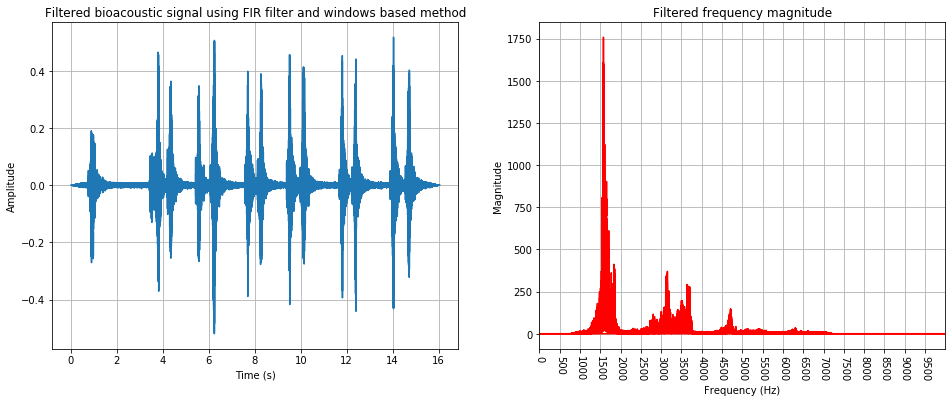

In [24]:
y_filtrada = np.convolve(y,h_BP)

t_nuevo= np.arange(len(y_filtrada))/sr

plt.figure(figsize=(16, 6))                             
plt.subplot(1, 2, 1)
plt.grid()
plt.plot(t_nuevo,y_filtrada)                                          
plt.title('Filtered bioacoustic signal using FIR filter and windows based method')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')


X_nuevo = np.fft.fft(y_filtrada)                                       
freq = np.fft.fftfreq(y_filtrada.size, d=1/sr)                   
plt.subplot(1, 2, 2)
plt.grid()
plt.plot(freq, np.abs(X_nuevo),'r')                           
plt.xlim([0, 10000])                                    
plt.title('Filtered frequency magnitude')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Magnitude') 
plt.xticks(np.arange(0, 10000, step=500))               # Pasos de las etiquetas en las frecuencias.
plt.xticks(rotation = -90)


plt.show()


In [25]:
sf.write('CantoTucan_FILTRADO_Hanning.wav', y_filtrada, sr)
ipd.Audio('CantoTucan_FILTRADO_Hanning.wav')

## Filtered signal spectrogram by using Hamming window:

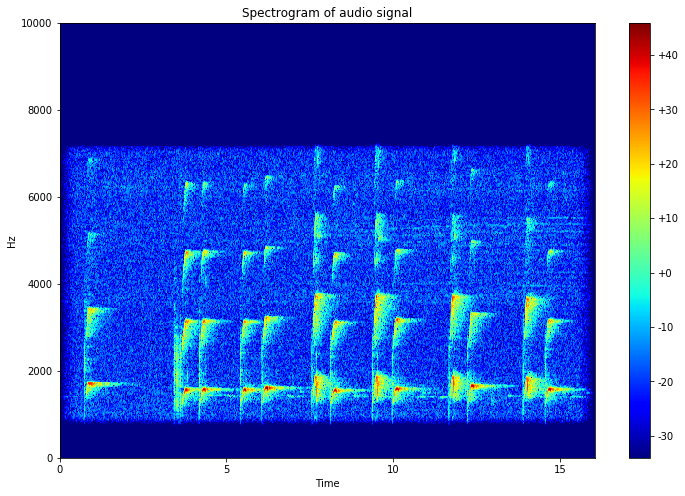

In [26]:
espectrograma(y_filtrada, sr)


# FIR filter design with Chebyshev's equiripple method:

In [31]:

frec_rechazo = frec_paso2 + banda_transicion


alpha_r = 40                                            # Band pass attenuation in dB
alpha_p = 0.1                                           # Supression band attenuation in dB.
w_r = 2*np.pi * frec_rechazo/sr                         # Normalized cut-off supression band frequency .
w_p = 2*np.pi * frec_paso2/sr                           # Normalized cut-off pass band frequency .
delta_r = 10 ** (-alpha_r/20)                           # Baand pass ripple 
delta_p = 1 - 10 ** (-alpha_p/20)                       # Rejection band ripple 
delta_f = (w_r - w_p)/(2*np.pi)                         # Transition band

M_2 = ((-20*np.log10(np.sqrt(delta_r*delta_p))-13)/(14.6* delta_f)) + 1              # Number of filter coefficients
M_2 = int(np.around(M_2))
N_2 = M_2 + 1                                               # Filter order
mval = [1,0]
dev = [delta_r, delta_p]


El filtro es de orden:  320


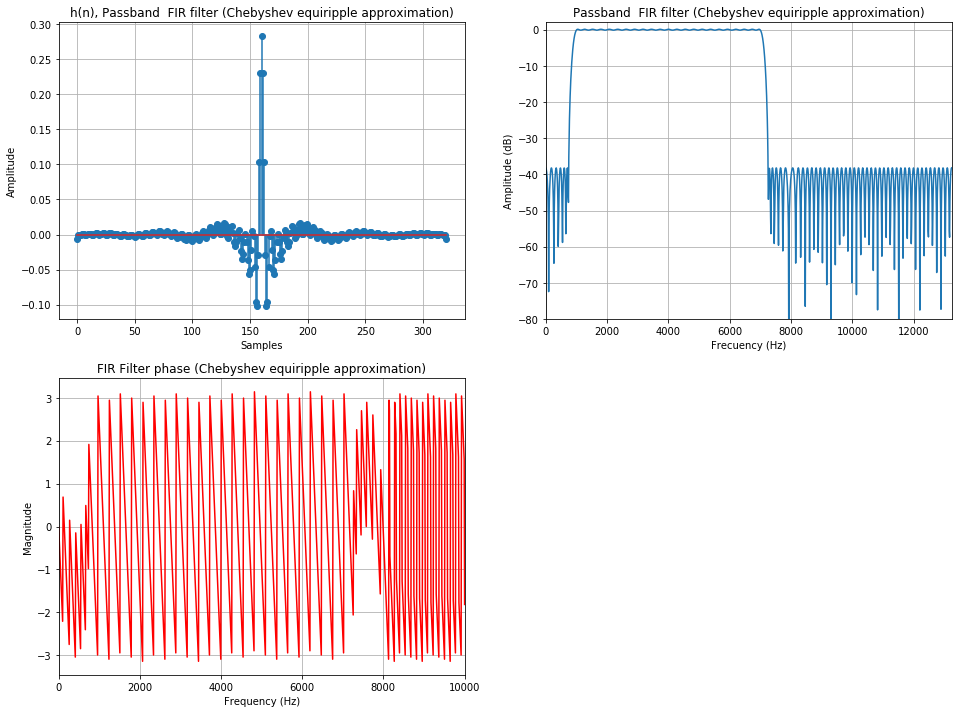

In [34]:
  
# Filtro pasa bandas:
banda = [frec_paso2, frec_paso1]  


edges = [0, banda[0] - banda_transicion, banda[0], banda[1], banda[1] + banda_transicion, 0.5*sr]
b = signal.remez(N_2, edges, [0, 1, 0], [delta_p, delta_r,delta_p], Hz=sr)
w_Chebyshev, h_Chebyshev = signal.freqz(b, 1, worN=2048)
plt.figure(figsize=(16, 12))                            
plt.subplot(2, 2, 1)
plt.grid()
plt.stem(b)
plt.title('h(n), Passband  FIR filter (Chebyshev equiripple approximation)')
plt.xlabel('Samples')
plt.ylabel('Amplitude')

plt.subplot(2, 2, 2)
plt.plot(0.5*sr*w_Chebyshev/np.pi, 20*np.log10(np.abs(h_Chebyshev)))
plt.ylim(-80, 2)
plt.xlim(0, 0.3*sr)
plt.grid(True)
plt.xlabel('Frecuency (Hz)')
plt.ylabel('Amplitude (dB)')
plt.title('Passband  FIR filter (Chebyshev equiripple approximation)')

#fase del filtro Chebyshev
phase = np.angle(h_Chebyshev)                                
plt.subplot(2, 2, 3)
plt.grid()
plt.plot(0.5*sr*w_Chebyshev/np.pi, phase,'r')    
plt.xlim([0, 10000]) 
plt.title('FIR Filter phase (Chebyshev equiripple approximation)')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Magnitude') 


#Orden del filtro:
print('El filtro es de orden: ',M_2)

In [36]:
y_filtrada_Chebyshev = np.convolve(original_signal, b)

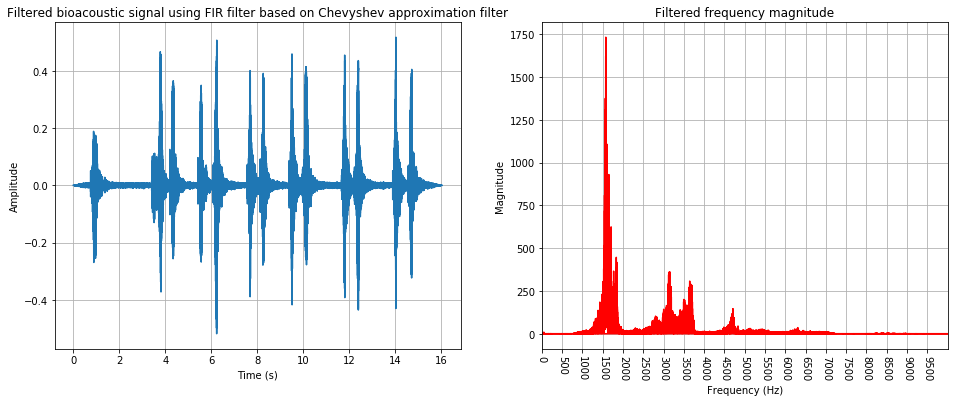

In [37]:
t_nuevo2= np.arange(len(y_filtrada_Chebyshev))/sr

plt.figure(figsize=(16, 6))                             # Tamaño de las figuras a imprimir.
plt.subplot(1, 2, 1)
plt.grid()
plt.plot(t_nuevo2,y_filtrada_Chebyshev)                                          # Gráfica del audio en el tiempo.
plt.title('Filtered bioacoustic signal using FIR filter based on Chevyshev approximation filter')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')


X_nuevo2 = np.fft.fft(y_filtrada_Chebyshev)                                       # Transformada rápida de Fourier de la señal.
freq2 = np.fft.fftfreq(y_filtrada_Chebyshev.size, d=1/sr)                   # Eje de las frecuencias normalizando.
plt.subplot(1, 2, 2)
plt.grid()
plt.plot(freq2, (np.abs(X_nuevo2)),'r')                           # Se imprime la magnitud de la transformada.
plt.xlim([0, 10000])                                    # Se visualizan únicamente las frecuencias positivas.
plt.title('Filtered frequency magnitude')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Magnitude') 
plt.xticks(np.arange(0, 10000, step=500))               # Pasos de las etiquetas en las frecuencias.
plt.xticks(rotation = -90)

plt.show()

In [38]:
sf.write('CantoTucan_FILTRADO_Chebyshev.wav', y_filtrada_Chebyshev, sr)
ipd.Audio('CantoTucan_FILTRADO_Chebyshev.wav')

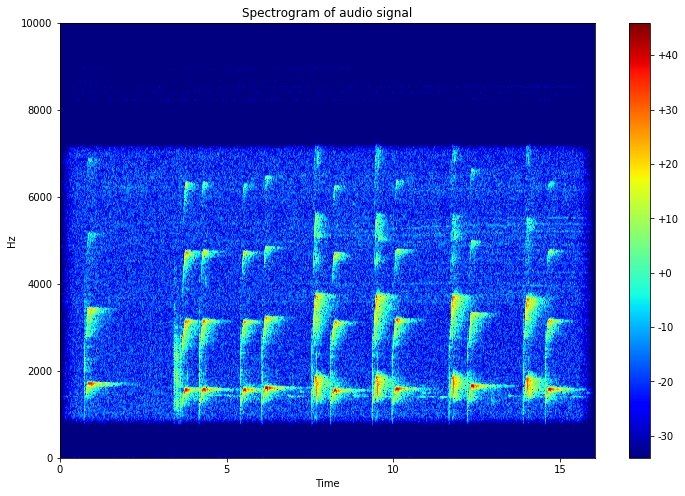

In [39]:
espectrograma(y_filtrada_Chebyshev, sr)


# IIR filter design with bilineal transformation 

Omega_p1,2: 302300227.2974686 should be equal to Omega_s1,2: 236258769.3548149 66041457.942653716


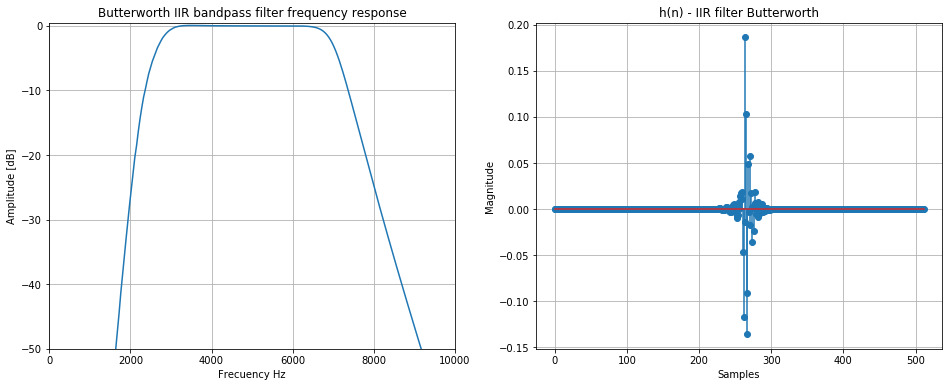

In [50]:
T = 1/sr
banda_transicion = 250
f_p1 = 1000
f_p2 = 7000
f_s1 = f_p1 - banda_transicion 
f_s2 = f_p2 + banda_transicion 

omega_p1 = 2*np.pi*(f_p1/sr)
omega_p2 = 2*np.pi*(f_p2/sr)
omega_s1 = 2*np.pi*(f_s1/sr)
omega_s2 = 2*np.pi*(f_s2/sr)

Omega_p1 = (2/T)*np.tan(omega_p1/2)         #Pre-warping
Omega_p2 = (2/T)*np.tan(omega_p2/2)         #Pre-warping
Omega_s1 = (2/T)*np.tan(omega_s1/2)         #Pre-warping
Omega_s2 = (2/T)*np.tan(omega_s2/2)         #Pre-warping


print('Omega_p1,2:', Omega_p1*Omega_p2, 'should be equal to Omega_s1,2:', Omega_s1*Omega_s2, Omega_p1*Omega_p2-Omega_s1*Omega_s2) # sino,podría modificar Omega_s1
Bw_butter = Omega_p2 - Omega_p1             #Band width

#Filtro prototipo:
OMEGA_p = 1
OMEGA_s = OMEGA_p* ((Omega_p1*Omega_p2)-(Omega_s1)**2)/(Omega_s1*Bw_butter)
Omega_0 = np.sqrt(Omega_p1*Omega_p2)
ATEN_BP = 3
ATEN_BR = 40

N_butter, Wn_butter = sig.buttord(OMEGA_p, OMEGA_s, ATEN_BP, ATEN_BR, sr)
B_butter, A_butter = sig.butter(N_butter, Wn_butter,'low', sr)
BT, AT = sig.lp2bp(B_butter, A_butter, Omega_0, Bw_butter)
num, den = sig.bilinear(BT, AT, sr)
w_butter, h_butter = sig.freqz(num, den, 512)


plt.figure(figsize=(16, 6))                             
plt.subplot(1, 2, 1)

plt.plot(0.5*sr*w_butter/np.pi, 20*np.log10(abs(h_butter)))
plt.title('Butterworth IIR bandpass filter frequency response')
plt.xlabel('Frecuency Hz')
plt.ylabel('Amplitude [dB]')
plt.grid()
plt.axis([0, 10000, -50, 0.5])


H_butter = np.fft.ifft(h_butter)                                    
H_butter1 = (np.fft.ifftshift(H_butter))
plt.subplot(1, 2, 2)
plt.stem(H_butter1)                                   
plt.title('h(n) - IIR filter Butterworth')
plt.xlabel('Samples')
plt.ylabel('Magnitude') 
plt.grid()

plt.show() 


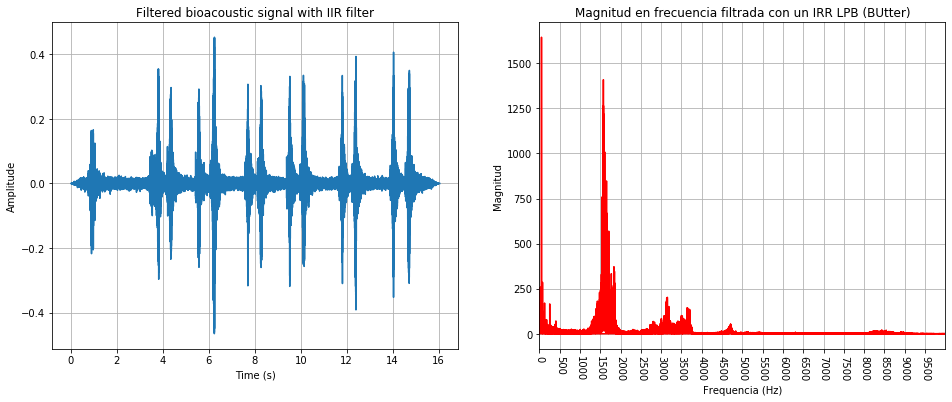

In [51]:
y_filtrada_butter = np.convolve(original_signal,abs(H_butter1))

t_nuevo_butter= np.arange(len(y_filtrada_butter))/sr

plt.figure(figsize=(16, 6))                             # Tamaño de las figuras a imprimir.
plt.subplot(1, 2, 1)
plt.grid()
plt.plot(t_nuevo_butter,y_filtrada_butter)                                          # Gráfica del audio en el tiempo.
plt.title('Filtered bioacoustic signal with IIR filter')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')


X_nuevo_butter = np.fft.fft(y_filtrada_butter)                                       # Transformada rápida de Fourier de la señal.
freq_butter = np.fft.fftfreq(y_filtrada_butter.size, d=1/sr)                   # Eje de las frecuencias normalizando.
plt.subplot(1, 2, 2)
plt.grid()
plt.plot(freq_butter, np.abs(X_nuevo_butter),'r')                           # Se imprime la magnitud de la transformada.
plt.xlim([0, 10000])                                    # Se visualizan únicamente las frecuencias positivas.
#plt.ylim([-1, 2000])       
plt.title('Magnitud en frecuencia filtrada con un IRR LPB (BUtter)')
plt.xlabel('Frequencia (Hz)')
plt.ylabel('Magnitud') 
plt.xticks(np.arange(0, 10000, step=500))               # Pasos de las etiquetas en las frecuencias.
plt.xticks(rotation = -90)


plt.show()

In [52]:
sf.write('CantoTucan_FILTRADO_BUTTER.wav', y_filtrada_butter, sr)
ipd.Audio('CantoTucan_FILTRADO_BUTTER.wav')


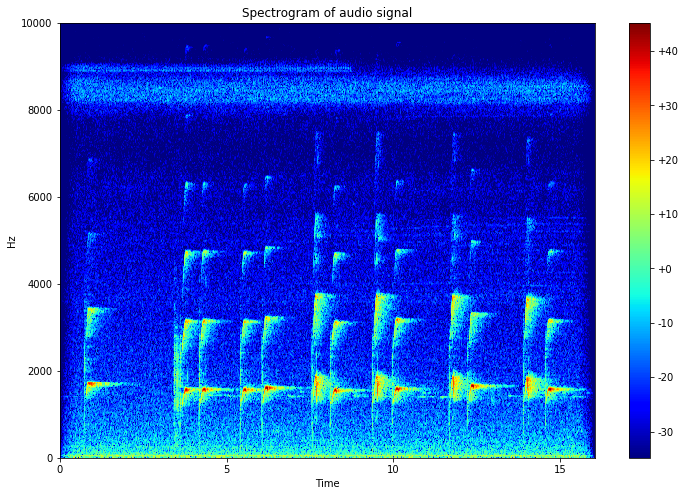

In [53]:
espectrograma(y_filtrada_butter, sr)

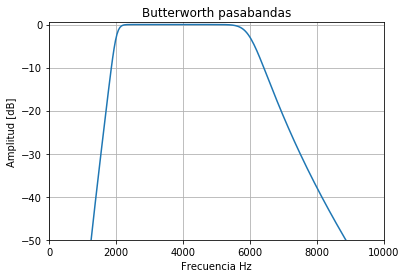

In [44]:
f_s1=100 
f_p1=2000
f_p2=6000
f_s2=7000 


N_butter2, Wn_butter2 = signal.buttord([f_p1, f_p2], [f_s1, f_s2], 3, 20, fs = sr)
b_butter2, a_butter2 = signal.butter(N_butter2, Wn_butter2, 'band', fs = sr)
w_butter2, h_butter2 = signal.freqz(b_butter2, a_butter2,512, fs = sr)
plt.plot(w_butter2, 20 * np.log10(abs(h_butter2)))
plt.title('Butterworth pasabandas')
plt.xlabel('Frecuencia Hz')
plt.ylabel('Amplitud [dB]')
plt.grid()
plt.axis([0, 10000, -50, 0.5])
plt.show()

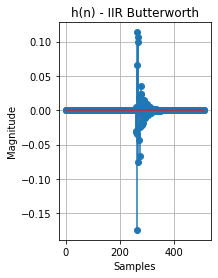

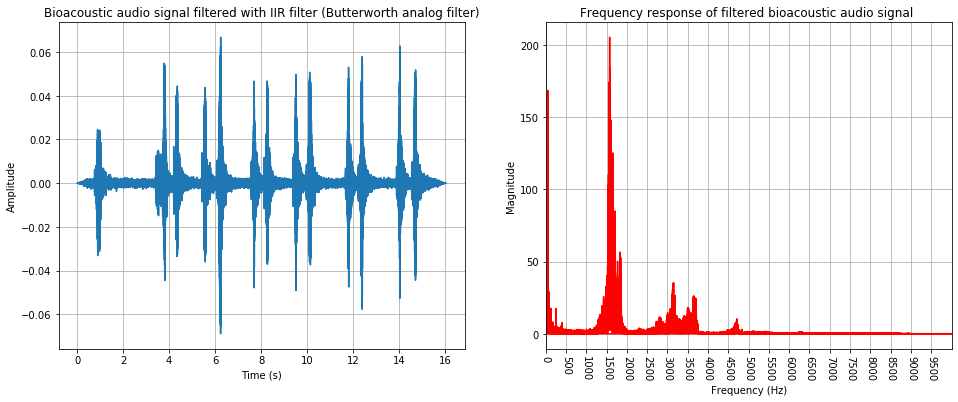

In [45]:
H_butter2 = np.fft.ifft(h_butter2)                                    
H_butter2 = (np.fft.ifftshift(H_butter2))
plt.subplot(1, 2, 2)
plt.stem((H_butter2))                                   
plt.title('h(n) - IIR Butterworth')
plt.xlabel('Samples')
plt.ylabel('Magnitude') 
plt.grid()

plt.show()

y_filtrada_butter2 = np.convolve(original_signal,abs((H_butter2)**2))

t_nuevo_butter2= np.arange(len(y_filtrada_butter2))/sr

plt.figure(figsize=(16, 6))                            
plt.subplot(1, 2, 1)
plt.grid()
plt.plot(t_nuevo_butter2,y_filtrada_butter2)                                          
plt.title('Bioacoustic audio signal filtered with IIR filter (Butterworth analog filter)')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')


X_nuevo_butter2 = np.fft.fft(y_filtrada_butter2)                                       
freq_butter2 = np.fft.fftfreq(y_filtrada_butter2.size, d=1/sr)                  
plt.subplot(1, 2, 2)
plt.grid()
plt.plot(freq_butter2, np.abs(X_nuevo_butter2),'r')                           
plt.xlim([0, 10000])                                    
#plt.ylim([-1, 2000])       
plt.title('Frequency response of filtered bioacoustic audio signal ')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Magnitude') 
plt.xticks(np.arange(0, 10000, step=500))               
plt.xticks(rotation = -90)


plt.show()

In [46]:
sf.write('CantoTucan_FILTRADO_BUTTER.wav', y_filtrada_butter2, sr)
ipd.Audio('CantoTucan_FILTRADO_BUTTER.wav')

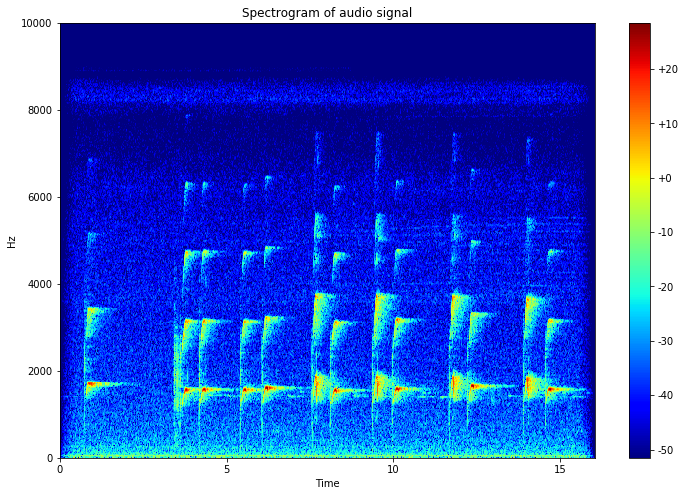

In [47]:
espectrograma(y_filtrada_butter2, sr)